# 📊 Exploratory Data Analysis: Malimg Dataset

## Deep Learning for Malware Detection and Classification

---

**Objective:** Comprehensive analysis of the Malimg dataset to understand:
1. Class distribution and imbalance patterns
2. Image properties (dimensions, pixel intensities)
3. Visual characteristics of different malware families
4. Statistical patterns that inform preprocessing and augmentation

**Dataset:** Malimg - 9,339 malware visualization images across 25 families

---

## 1. Environment Setup and Imports

In [1]:
# Standard libraries
import os
import sys
from pathlib import Path
from collections import Counter

# Data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Set up paths
PROJECT_ROOT = Path('/workspaces/CybersecurityXDeepLearning')
DATA_DIR = PROJECT_ROOT / 'data'
RAW_DIR = DATA_DIR / 'raw' / 'malimg'
SPLITS_DIR = DATA_DIR / 'splits'

# Style settings
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('husl')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

print(f"Project Root: {PROJECT_ROOT}")
print(f"Data Directory: {DATA_DIR}")
print(f"Raw Data: {RAW_DIR}")
print(f"Splits: {SPLITS_DIR}")

Project Root: /workspaces/CybersecurityXDeepLearning
Data Directory: /workspaces/CybersecurityXDeepLearning/data
Raw Data: /workspaces/CybersecurityXDeepLearning/data/raw/malimg
Splits: /workspaces/CybersecurityXDeepLearning/data/splits


## 2. Dataset Overview

### 2.1 Load Split Files

In [2]:
# Load split CSVs
train_df = pd.read_csv(SPLITS_DIR / 'train.csv')
val_df = pd.read_csv(SPLITS_DIR / 'val.csv')
test_df = pd.read_csv(SPLITS_DIR / 'test.csv')
label_mapping = pd.read_csv(SPLITS_DIR / 'label_mapping.csv')

# Combine all for full dataset analysis
train_df['split'] = 'train'
val_df['split'] = 'val'
test_df['split'] = 'test'
full_df = pd.concat([train_df, val_df, test_df], ignore_index=True)

print("=" * 60)
print("DATASET SUMMARY")
print("=" * 60)
print(f"\nTotal Samples: {len(full_df):,}")
print(f"Training Set:  {len(train_df):,} ({len(train_df)/len(full_df)*100:.1f}%)")
print(f"Validation:    {len(val_df):,} ({len(val_df)/len(full_df)*100:.1f}%)")
print(f"Test Set:      {len(test_df):,} ({len(test_df)/len(full_df)*100:.1f}%)")
print(f"\nNumber of Classes: {len(label_mapping)}")
print("\n" + "=" * 60)

DATASET SUMMARY

Total Samples: 9,339
Training Set:  6,527 (69.9%)
Validation:    1,389 (14.9%)
Test Set:      1,423 (15.2%)

Number of Classes: 25



In [3]:
# Display label mapping
print("\nMalware Family Label Mapping:")
print("-" * 40)
display(label_mapping)


Malware Family Label Mapping:
----------------------------------------


,family_name,label_idx
0,Adialer.C,0
1,Agent.FYI,1
2,Allaple.A,2
3,Allaple.L,3
4,Alueron.gen!J,4
5,Autorun.K,5
6,C2LOP.P,6
7,C2LOP.gen!g,7
8,Dialplatform.B,8
9,Dontovo.A,9


## 3. Class Distribution Analysis

### 3.1 Overall Class Distribution

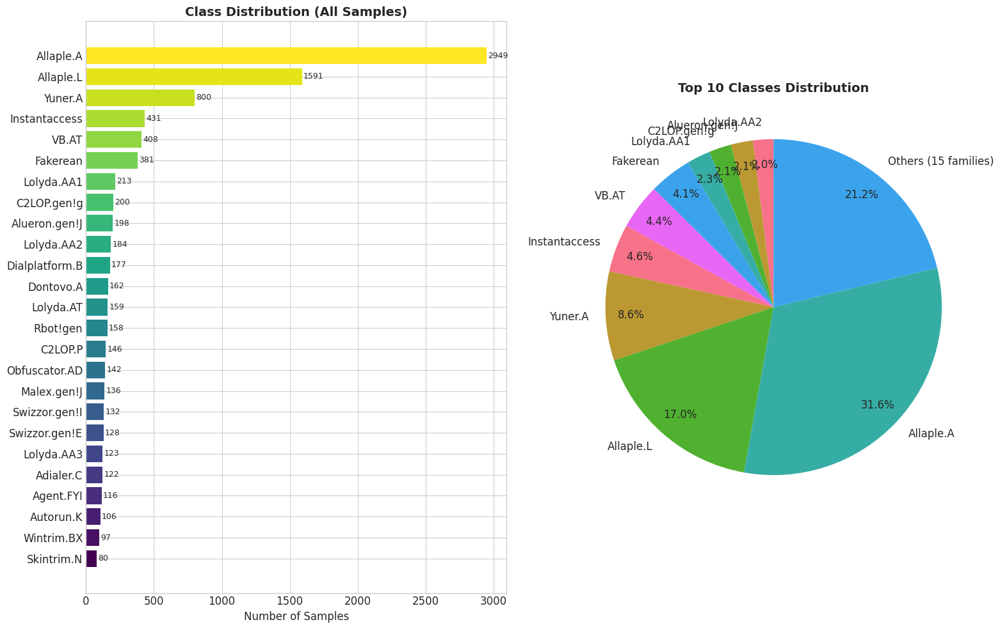


CLASS IMBALANCE STATISTICS
Maximum samples (Allaple.L):    2,949
Minimum samples (Skintrim.N):   80
Imbalance Ratio:                36.9x
Mean samples per class:         373.6
Median samples per class:       159.0
Standard Deviation:             622.7


In [4]:
# Calculate class distribution
class_counts = full_df['family_name'].value_counts().sort_values(ascending=True)

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 10))

# Horizontal bar chart
colors = plt.cm.viridis(np.linspace(0, 1, len(class_counts)))
ax1 = axes[0]
bars = ax1.barh(range(len(class_counts)), class_counts.values, color=colors)
ax1.set_yticks(range(len(class_counts)))
ax1.set_yticklabels(class_counts.index)
ax1.set_xlabel('Number of Samples')
ax1.set_title('Class Distribution (All Samples)', fontsize=14, fontweight='bold')

# Add value labels
for i, (bar, count) in enumerate(zip(bars, class_counts.values)):
    ax1.text(bar.get_width() + 10, bar.get_y() + bar.get_height()/2, 
             f'{count}', va='center', fontsize=9)

# Pie chart
ax2 = axes[1]
top_10 = class_counts.tail(10)
others = class_counts.head(len(class_counts) - 10).sum()
pie_data = list(top_10.values) + [others]
pie_labels = list(top_10.index) + [f'Others ({len(class_counts)-10} families)']

wedges, texts, autotexts = ax2.pie(pie_data, labels=pie_labels, autopct='%1.1f%%',
                                    startangle=90, pctdistance=0.85)
ax2.set_title('Top 10 Classes Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# Print statistics
print("\n" + "=" * 60)
print("CLASS IMBALANCE STATISTICS")
print("=" * 60)
print(f"Maximum samples (Allaple.L):    {class_counts.max():,}")
print(f"Minimum samples (Skintrim.N):   {class_counts.min():,}")
print(f"Imbalance Ratio:                {class_counts.max() / class_counts.min():.1f}x")
print(f"Mean samples per class:         {class_counts.mean():.1f}")
print(f"Median samples per class:       {class_counts.median():.1f}")
print(f"Standard Deviation:             {class_counts.std():.1f}")

### 3.2 Split-wise Distribution (Verify Stratification)

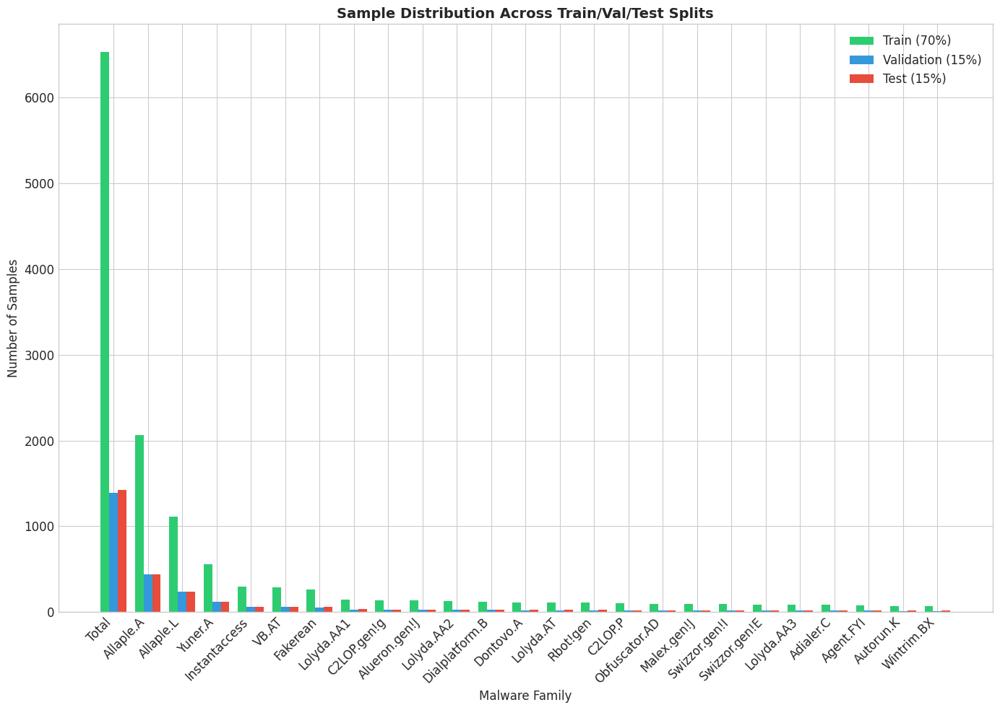


Split Verification (should be ~70/15/15):
split           train   val  test
family_name                      
Total            69.9  14.9  15.2
Allaple.A        70.0  15.0  15.0
Allaple.L        70.0  15.0  15.1
Yuner.A          70.0  15.0  15.0
Instantaccess    69.8  14.8  15.3
VB.AT            69.9  15.0  15.2
Fakerean         69.8  15.0  15.2
Lolyda.AA1       70.0  14.6  15.5
C2LOP.gen!g      70.0  15.0  15.0
Alueron.gen!J    69.7  14.6  15.7
Lolyda.AA2       69.6  14.7  15.8
Dialplatform.B   69.5  14.7  15.8
Dontovo.A        69.8  14.8  15.4
Lolyda.AT        69.8  14.5  15.7
Rbot!gen         69.6  14.6  15.8
C2LOP.P          69.9  14.4  15.8
Obfuscator.AD    69.7  14.8  15.5
Malex.gen!J      69.9  14.7  15.4
Swizzor.gen!I    69.7  14.4  15.9
Swizzor.gen!E    69.5  14.8  15.6
Lolyda.AA3       69.9  14.6  15.4
Adialer.C        69.7  14.8  15.6
Agent.FYI        69.8  14.7  15.5
Autorun.K        69.8  14.2  16.0
Wintrim.BX       69.1  14.4  16.5
Skintrim.N       70.0  15.0  15.0


In [5]:
# Create split comparison
split_counts = pd.crosstab(full_df['family_name'], full_df['split'], 
                           margins=True, margins_name='Total')
split_counts = split_counts.sort_values('Total', ascending=False)

# Calculate percentages
split_pcts = split_counts.div(split_counts['Total'], axis=0) * 100
split_pcts = split_pcts[['train', 'val', 'test']]

# Visualize
fig, ax = plt.subplots(figsize=(14, 10))

x = np.arange(len(split_counts) - 1)  # Exclude 'Total' row
width = 0.25

families = split_counts.index[:-1]  # Exclude 'Total'
train_vals = split_counts.loc[families, 'train'].values
val_vals = split_counts.loc[families, 'val'].values
test_vals = split_counts.loc[families, 'test'].values

bars1 = ax.bar(x - width, train_vals, width, label='Train (70%)', color='#2ecc71')
bars2 = ax.bar(x, val_vals, width, label='Validation (15%)', color='#3498db')
bars3 = ax.bar(x + width, test_vals, width, label='Test (15%)', color='#e74c3c')

ax.set_xlabel('Malware Family')
ax.set_ylabel('Number of Samples')
ax.set_title('Sample Distribution Across Train/Val/Test Splits', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(families, rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'split_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nSplit Verification (should be ~70/15/15):")
print(split_pcts.round(1).to_string())

## 4. Image Analysis

### 4.1 Load Sample Images for Analysis

In [6]:
def load_image(path):
    """Load image and return as numpy array."""
    try:
        img = Image.open(path)
        return np.array(img)
    except Exception as e:
        print(f"Error loading {path}: {e}")
        return None

# Collect image statistics
image_stats = []
sample_images = {}

print("Analyzing images from each family...")
for idx, row in full_df.iterrows():
    img_path = row['image_path']
    if os.path.exists(img_path):
        img = load_image(img_path)
        if img is not None:
            # Handle multi-channel images (if any)
            if len(img.shape) == 3:
                img = img[:, :, 0] if img.shape[2] >= 1 else img
            
            stats = {
                'family': row['family_name'],
                'height': img.shape[0],
                'width': img.shape[1] if len(img.shape) > 1 else 1,
                'pixels': img.size,
                'mean': img.mean(),
                'std': img.std(),
                'min': img.min(),
                'max': img.max(),
                'entropy': -np.sum((np.histogram(img, bins=256, range=(0,255))[0]/img.size + 1e-10) * 
                                   np.log2(np.histogram(img, bins=256, range=(0,255))[0]/img.size + 1e-10))
            }
            image_stats.append(stats)
            
            # Store one sample per family
            if row['family_name'] not in sample_images:
                sample_images[row['family_name']] = (img_path, img)

stats_df = pd.DataFrame(image_stats)
print(f"\nAnalyzed {len(stats_df)} images")

Analyzing images from each family...

Analyzed 9339 images

Analyzed 9339 images


### 4.2 Image Dimension Distribution

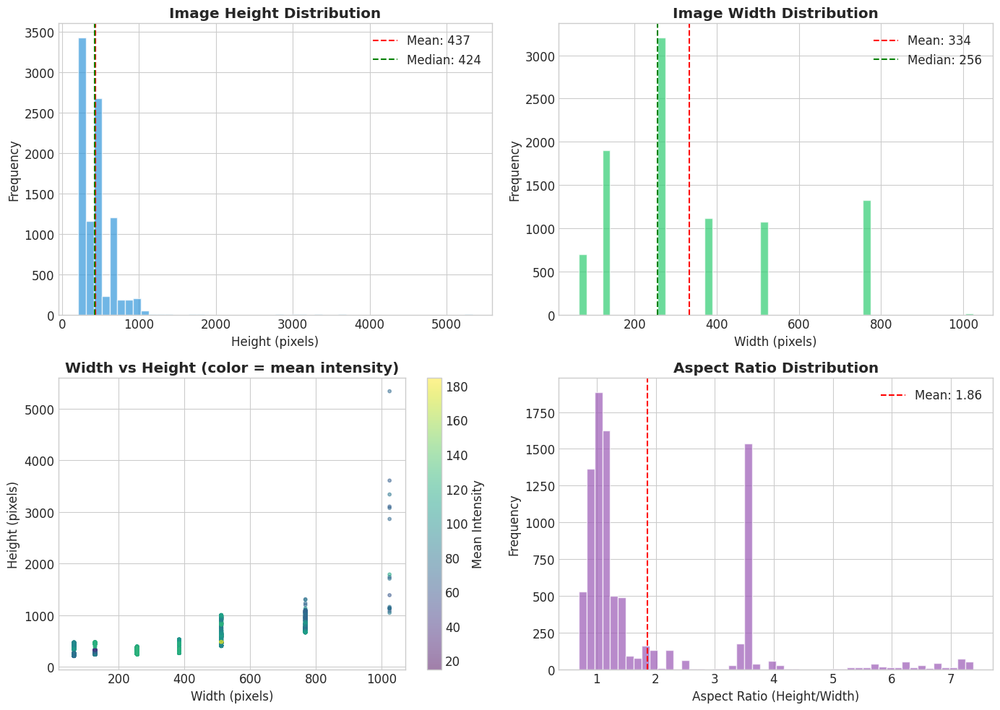


IMAGE DIMENSION STATISTICS
Height - Min: 208, Max: 5334, Mean: 436.8
Width  - Min: 64, Max: 1024, Mean: 334.2

NOTE: Images need resizing to 224x224 for model input


In [7]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Height distribution
ax1 = axes[0, 0]
ax1.hist(stats_df['height'], bins=50, color='#3498db', edgecolor='white', alpha=0.7)
ax1.axvline(stats_df['height'].mean(), color='red', linestyle='--', label=f'Mean: {stats_df["height"].mean():.0f}')
ax1.axvline(stats_df['height'].median(), color='green', linestyle='--', label=f'Median: {stats_df["height"].median():.0f}')
ax1.set_xlabel('Height (pixels)')
ax1.set_ylabel('Frequency')
ax1.set_title('Image Height Distribution', fontweight='bold')
ax1.legend()

# Width distribution
ax2 = axes[0, 1]
ax2.hist(stats_df['width'], bins=50, color='#2ecc71', edgecolor='white', alpha=0.7)
ax2.axvline(stats_df['width'].mean(), color='red', linestyle='--', label=f'Mean: {stats_df["width"].mean():.0f}')
ax2.axvline(stats_df['width'].median(), color='green', linestyle='--', label=f'Median: {stats_df["width"].median():.0f}')
ax2.set_xlabel('Width (pixels)')
ax2.set_ylabel('Frequency')
ax2.set_title('Image Width Distribution', fontweight='bold')
ax2.legend()

# Scatter plot of dimensions
ax3 = axes[1, 0]
scatter = ax3.scatter(stats_df['width'], stats_df['height'], 
                       c=stats_df['mean'], cmap='viridis', alpha=0.5, s=10)
ax3.set_xlabel('Width (pixels)')
ax3.set_ylabel('Height (pixels)')
ax3.set_title('Width vs Height (color = mean intensity)', fontweight='bold')
plt.colorbar(scatter, ax=ax3, label='Mean Intensity')

# Aspect ratio
ax4 = axes[1, 1]
aspect_ratios = stats_df['height'] / stats_df['width']
ax4.hist(aspect_ratios, bins=50, color='#9b59b6', edgecolor='white', alpha=0.7)
ax4.axvline(aspect_ratios.mean(), color='red', linestyle='--', label=f'Mean: {aspect_ratios.mean():.2f}')
ax4.set_xlabel('Aspect Ratio (Height/Width)')
ax4.set_ylabel('Frequency')
ax4.set_title('Aspect Ratio Distribution', fontweight='bold')
ax4.legend()

plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'image_dimensions.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "=" * 60)
print("IMAGE DIMENSION STATISTICS")
print("=" * 60)
print(f"Height - Min: {stats_df['height'].min()}, Max: {stats_df['height'].max()}, Mean: {stats_df['height'].mean():.1f}")
print(f"Width  - Min: {stats_df['width'].min()}, Max: {stats_df['width'].max()}, Mean: {stats_df['width'].mean():.1f}")
print(f"\nNOTE: Images need resizing to 224x224 for model input")

### 4.3 Pixel Intensity Analysis

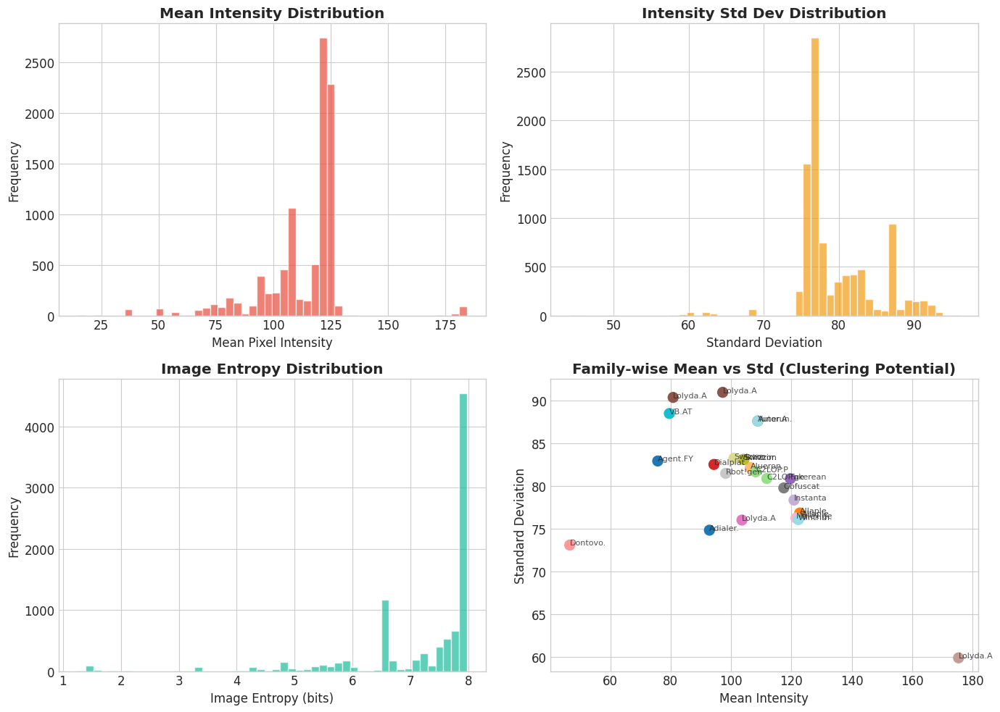


INTENSITY STATISTICS
Mean Intensity  - Range: [14.8, 184.4], Avg: 113.6
Std Deviation   - Range: [44.2, 96.0], Avg: 79.6
Entropy         - Range: [1.26, 7.97], Avg: 7.23


In [8]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Mean intensity distribution
ax1 = axes[0, 0]
ax1.hist(stats_df['mean'], bins=50, color='#e74c3c', edgecolor='white', alpha=0.7)
ax1.set_xlabel('Mean Pixel Intensity')
ax1.set_ylabel('Frequency')
ax1.set_title('Mean Intensity Distribution', fontweight='bold')

# Standard deviation distribution
ax2 = axes[0, 1]
ax2.hist(stats_df['std'], bins=50, color='#f39c12', edgecolor='white', alpha=0.7)
ax2.set_xlabel('Standard Deviation')
ax2.set_ylabel('Frequency')
ax2.set_title('Intensity Std Dev Distribution', fontweight='bold')

# Entropy distribution
ax3 = axes[1, 0]
ax3.hist(stats_df['entropy'], bins=50, color='#1abc9c', edgecolor='white', alpha=0.7)
ax3.set_xlabel('Image Entropy (bits)')
ax3.set_ylabel('Frequency')
ax3.set_title('Image Entropy Distribution', fontweight='bold')

# Mean vs Std scatter by family
ax4 = axes[1, 1]
family_stats = stats_df.groupby('family').agg({'mean': 'mean', 'std': 'mean'}).reset_index()
scatter = ax4.scatter(family_stats['mean'], family_stats['std'], s=100, c=range(len(family_stats)), cmap='tab20')

# Add family labels
for i, row in family_stats.iterrows():
    ax4.annotate(row['family'][:8], (row['mean'], row['std']), fontsize=8, alpha=0.8)

ax4.set_xlabel('Mean Intensity')
ax4.set_ylabel('Standard Deviation')
ax4.set_title('Family-wise Mean vs Std (Clustering Potential)', fontweight='bold')

plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'pixel_intensity.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "=" * 60)
print("INTENSITY STATISTICS")
print("=" * 60)
print(f"Mean Intensity  - Range: [{stats_df['mean'].min():.1f}, {stats_df['mean'].max():.1f}], Avg: {stats_df['mean'].mean():.1f}")
print(f"Std Deviation   - Range: [{stats_df['std'].min():.1f}, {stats_df['std'].max():.1f}], Avg: {stats_df['std'].mean():.1f}")
print(f"Entropy         - Range: [{stats_df['entropy'].min():.2f}, {stats_df['entropy'].max():.2f}], Avg: {stats_df['entropy'].mean():.2f}")

### 4.4 Per-Family Intensity Boxplots

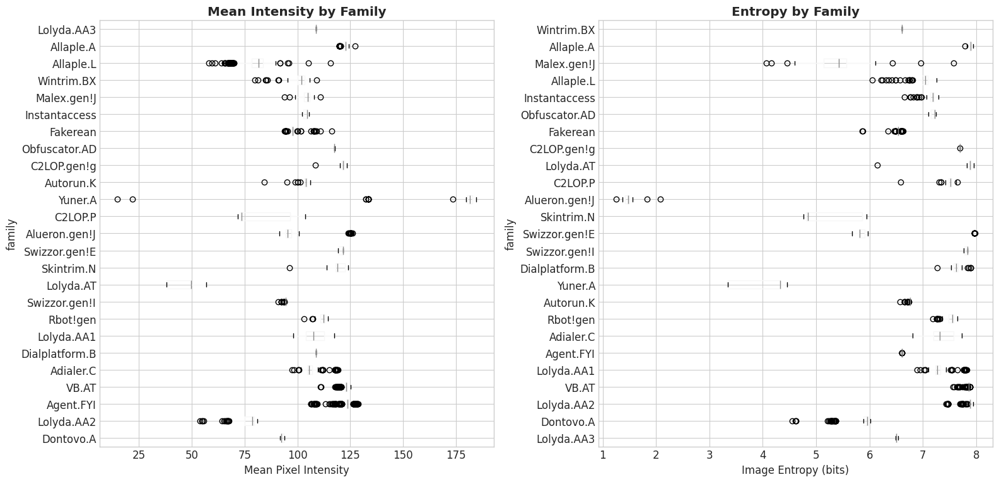

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Order families by median mean intensity
family_order = stats_df.groupby('family')['mean'].median().sort_values().index

# Mean intensity boxplot
ax1 = axes[0]
stats_df.boxplot(column='mean', by='family', ax=ax1, vert=False,
                  positions=range(len(family_order)))
ax1.set_yticklabels(family_order)
ax1.set_xlabel('Mean Pixel Intensity')
ax1.set_title('Mean Intensity by Family', fontweight='bold')
ax1.get_figure().suptitle('')  # Remove automatic title

# Entropy boxplot
ax2 = axes[1]
entropy_order = stats_df.groupby('family')['entropy'].median().sort_values().index
stats_df.boxplot(column='entropy', by='family', ax=ax2, vert=False,
                  positions=range(len(entropy_order)))
ax2.set_yticklabels(entropy_order)
ax2.set_xlabel('Image Entropy (bits)')
ax2.set_title('Entropy by Family', fontweight='bold')
ax2.get_figure().suptitle('')

plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'family_intensity_boxplots.png', dpi=300, bbox_inches='tight')
plt.show()

## 5. Visual Sample Gallery

### 5.1 Sample from Each Malware Family

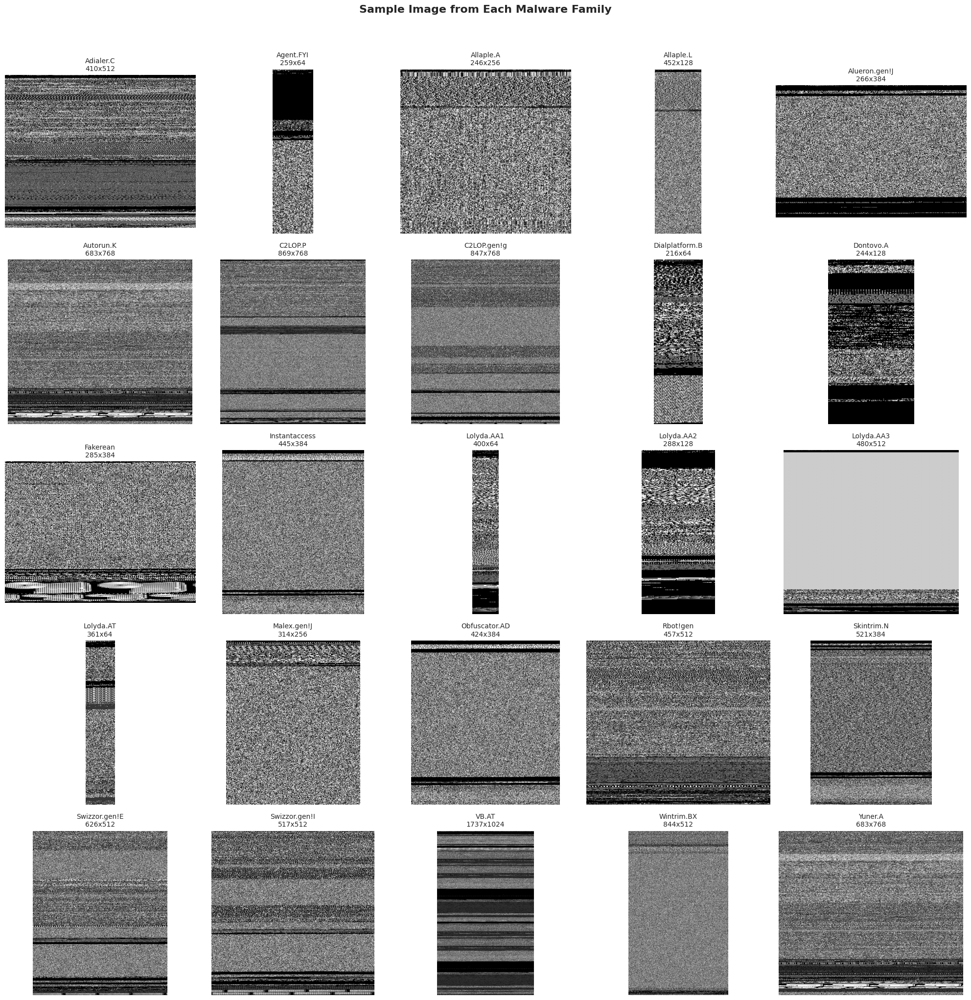

In [11]:
# Create grid of sample images (5x5 for 25 families)
n_families = len(sample_images)
n_cols = 5
n_rows = (n_families + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4*n_rows))
axes = axes.flatten()

for i, (family, (path, img)) in enumerate(sorted(sample_images.items())):
    ax = axes[i]
    ax.imshow(img, cmap='gray')
    ax.set_title(f'{family}\n{img.shape[0]}x{img.shape[1]}', fontsize=10)
    ax.axis('off')

# Hide empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Sample Image from Each Malware Family', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'sample_gallery.png', dpi=300, bbox_inches='tight')
plt.show()

### 5.2 Multiple Samples from Top Families

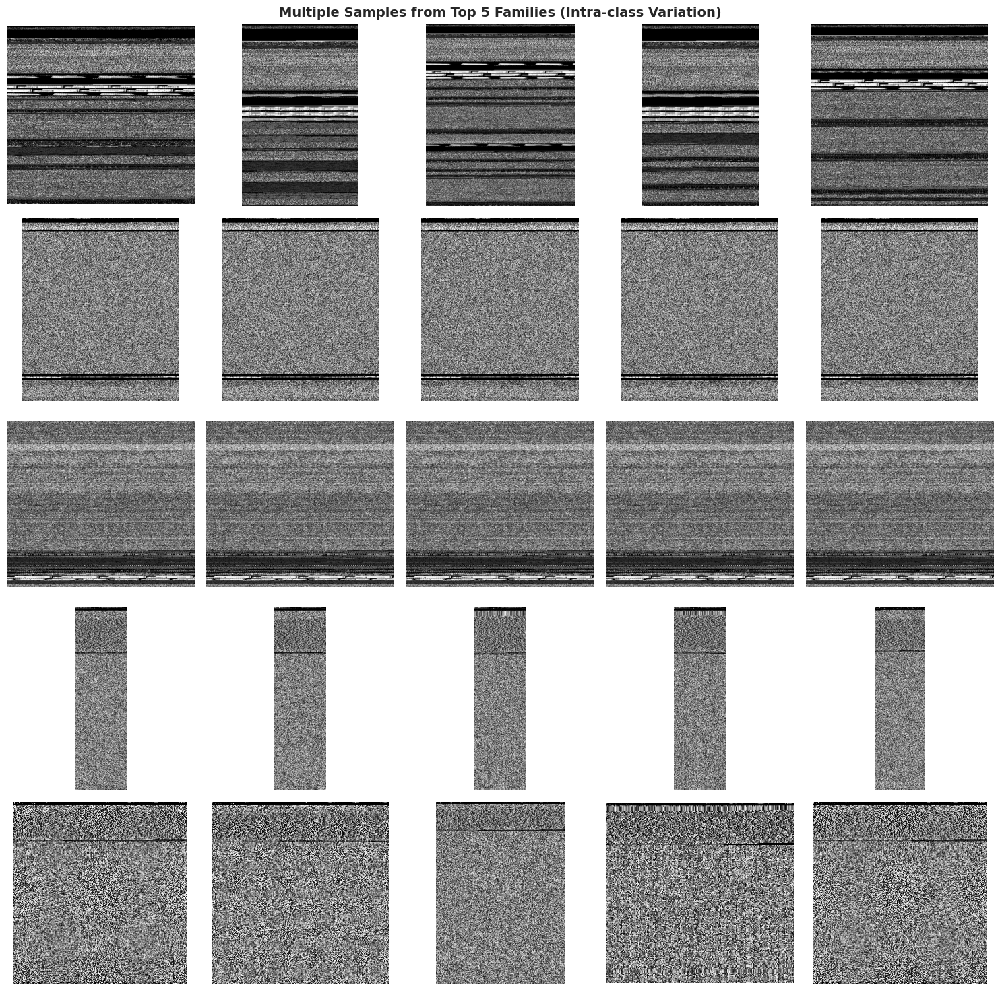

In [12]:
# Get top 5 families by count
top_families = class_counts.tail(5).index.tolist()

fig, axes = plt.subplots(5, 5, figsize=(15, 15))

for row, family in enumerate(top_families):
    # Get 5 random samples from this family
    family_samples = full_df[full_df['family_name'] == family].sample(min(5, len(full_df[full_df['family_name'] == family])))
    
    for col, (_, sample) in enumerate(family_samples.iterrows()):
        ax = axes[row, col]
        img = load_image(sample['image_path'])
        if img is not None:
            if len(img.shape) == 3:
                img = img[:, :, 0]
            ax.imshow(img, cmap='gray')
        ax.axis('off')
        if col == 0:
            ax.set_ylabel(family, fontsize=10, rotation=0, ha='right', va='center')

plt.suptitle('Multiple Samples from Top 5 Families (Intra-class Variation)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'top_families_samples.png', dpi=300, bbox_inches='tight')
plt.show()

## 6. Statistical Tests for Separability

### 6.1 ANOVA Test for Mean Intensity

In [13]:
from scipy import stats as sp_stats

# Prepare data for ANOVA
groups = [group['mean'].values for name, group in stats_df.groupby('family')]

# One-way ANOVA
f_stat, p_value = sp_stats.f_oneway(*groups)

print("=" * 60)
print("ANOVA TEST: Mean Intensity Across Families")
print("=" * 60)
print(f"\nF-statistic: {f_stat:.4f}")
print(f"P-value:     {p_value:.2e}")
print(f"\nConclusion: {'Significant difference between families!' if p_value < 0.05 else 'No significant difference'}")
print("\nThis suggests that mean intensity alone may provide discriminative power.")

ANOVA TEST: Mean Intensity Across Families

F-statistic: 6232.6621
P-value:     0.00e+00

Conclusion: Significant difference between families!

This suggests that mean intensity alone may provide discriminative power.


### 6.2 Correlation Heatmap

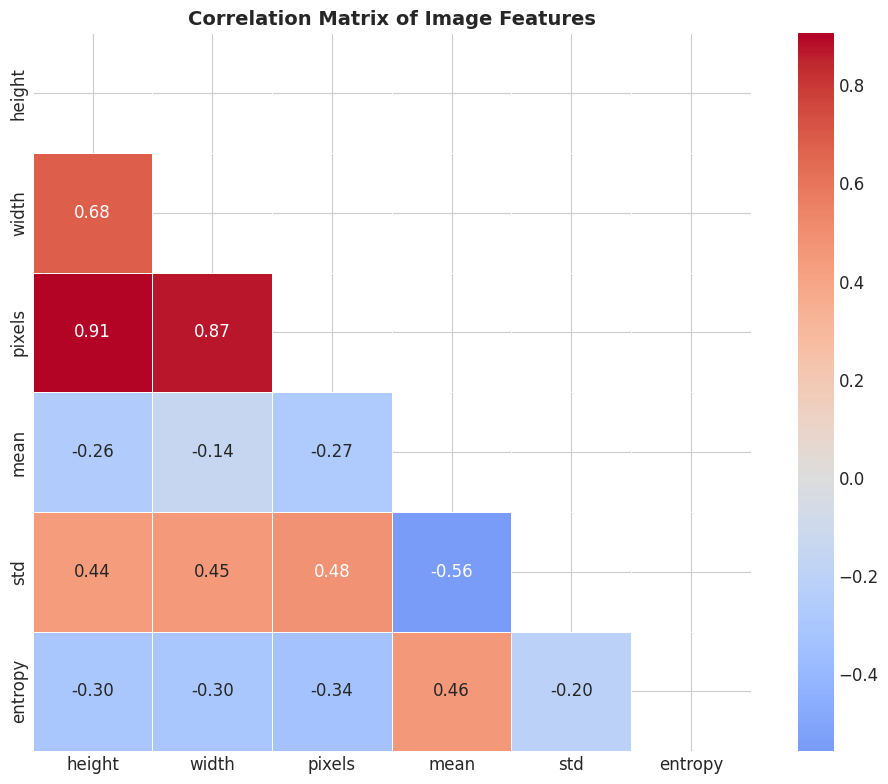

In [14]:
# Compute correlation matrix for numerical features
numeric_cols = ['height', 'width', 'pixels', 'mean', 'std', 'entropy']
corr_matrix = stats_df[numeric_cols].corr()

plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5, fmt='.2f')
plt.title('Correlation Matrix of Image Features', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

## 7. Class Imbalance Strategies

### 7.1 Analyze Imbalance and Recommend Strategies

In [15]:
# Calculate imbalance metrics
train_counts = train_df['family_name'].value_counts()

print("=" * 60)
print("CLASS IMBALANCE ANALYSIS & RECOMMENDATIONS")
print("=" * 60)

print(f"\n1. DATASET CHARACTERISTICS:")
print(f"   - Total training samples: {len(train_df)}")
print(f"   - Number of classes: {len(train_counts)}")
print(f"   - Largest class: {train_counts.max()} samples")
print(f"   - Smallest class: {train_counts.min()} samples")
print(f"   - Imbalance ratio: {train_counts.max()/train_counts.min():.1f}:1")

print(f"\n2. RECOMMENDED STRATEGIES:")
print("   a) Weighted Loss Function:")
print("      - Assign higher weights to minority classes")
print("      - weight[i] = total_samples / (n_classes * count[i])")

print("\n   b) Weighted Random Sampling:")
print("      - Oversample minority classes during training")
print("      - Ensures balanced batches")

print("\n   c) Data Augmentation:")
print("      - Apply transforms to increase effective dataset size")
print("      - Focus on minority classes")

# Calculate class weights
total = train_counts.sum()
n_classes = len(train_counts)
class_weights = {family: total / (n_classes * count) for family, count in train_counts.items()}

print("\n3. COMPUTED CLASS WEIGHTS:")
weight_df = pd.DataFrame({
    'Family': class_weights.keys(),
    'Samples': [train_counts[f] for f in class_weights.keys()],
    'Weight': class_weights.values()
}).sort_values('Weight', ascending=False)

display(weight_df)

CLASS IMBALANCE ANALYSIS & RECOMMENDATIONS

1. DATASET CHARACTERISTICS:
   - Total training samples: 6527
   - Number of classes: 25
   - Largest class: 2064 samples
   - Smallest class: 56 samples
   - Imbalance ratio: 36.9:1

2. RECOMMENDED STRATEGIES:
   a) Weighted Loss Function:
      - Assign higher weights to minority classes
      - weight[i] = total_samples / (n_classes * count[i])

   b) Weighted Random Sampling:
      - Oversample minority classes during training
      - Ensures balanced batches

   c) Data Augmentation:
      - Apply transforms to increase effective dataset size
      - Focus on minority classes

3. COMPUTED CLASS WEIGHTS:


,Family,Samples,Weight
24,Skintrim.N,56,4.662143
23,Wintrim.BX,67,3.896716
22,Autorun.K,74,3.528108
21,Agent.FYI,81,3.223210
20,Adialer.C,85,3.071529
19,Lolyda.AA3,86,3.035814
18,Swizzor.gen!E,89,2.933483
17,Swizzor.gen!I,92,2.837826
16,Malex.gen!J,95,2.748211
15,Obfuscator.AD,99,2.637172


### 7.2 Visualize Class Weights

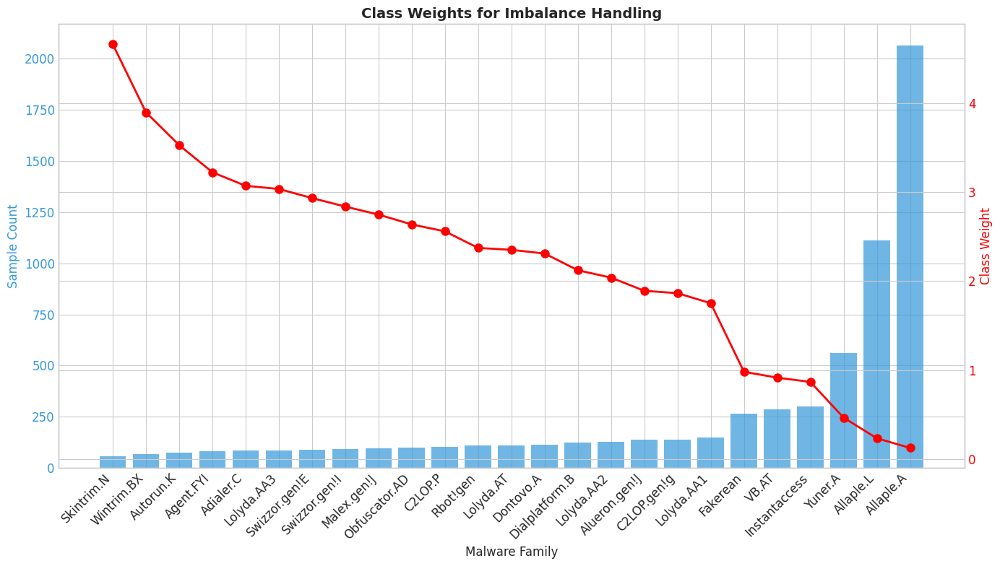

In [16]:
fig, ax = plt.subplots(figsize=(14, 8))

weight_df_sorted = weight_df.sort_values('Samples')
x = range(len(weight_df_sorted))

# Create twin axis
ax2 = ax.twinx()

bars = ax.bar(x, weight_df_sorted['Samples'], color='#3498db', alpha=0.7, label='Sample Count')
line = ax2.plot(x, weight_df_sorted['Weight'], 'ro-', linewidth=2, markersize=8, label='Class Weight')

ax.set_xticks(x)
ax.set_xticklabels(weight_df_sorted['Family'], rotation=45, ha='right')
ax.set_xlabel('Malware Family')
ax.set_ylabel('Sample Count', color='#3498db')
ax2.set_ylabel('Class Weight', color='red')

ax.tick_params(axis='y', labelcolor='#3498db')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('Class Weights for Imbalance Handling', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(PROJECT_ROOT / 'results' / 'plots' / 'class_weights.png', dpi=300, bbox_inches='tight')
plt.show()

## 8. Key Findings Summary

In [17]:
print("="*70)
print("                    KEY FINDINGS SUMMARY")
print("="*70)

print("\n📊 DATASET OVERVIEW:")
print(f"   • Total samples: {len(full_df):,}")
print(f"   • Number of malware families: 25")
print(f"   • Train/Val/Test split: 70%/15%/15%")

print("\n⚖️ CLASS IMBALANCE:")
print(f"   • Most common: Allaple.L ({class_counts.max()} samples)")
print(f"   • Least common: Skintrim.N ({class_counts.min()} samples)")
print(f"   • Imbalance ratio: {class_counts.max()/class_counts.min():.0f}:1")
print(f"   • Recommendation: Use weighted loss + weighted sampling")

print("\n🖼️ IMAGE CHARACTERISTICS:")
print(f"   • Variable dimensions (need resize to 224×224)")
print(f"   • Height range: {stats_df['height'].min()} - {stats_df['height'].max()} pixels")
print(f"   • Width range: {stats_df['width'].min()} - {stats_df['width'].max()} pixels")
print(f"   • Grayscale intensity: 0-255")

print("\n📈 STATISTICAL INSIGHTS:")
print(f"   • Mean intensity varies significantly across families (ANOVA p<0.001)")
print(f"   • Different families show distinct entropy patterns")
print(f"   • Visual patterns suggest good CNN separability")

print("\n🔧 PREPROCESSING RECOMMENDATIONS:")
print("   • Resize all images to 224×224 (ImageNet standard)")
print("   • Normalize pixel values to [0, 1] or [-1, 1]")
print("   • Apply data augmentation (rotation, flip, noise)")
print("   • Use grayscale input (1 channel)")

print("\n🚀 MODEL RECOMMENDATIONS:")
print("   • Transfer learning with pretrained ResNet-50")
print("   • Custom CNN as baseline comparison")
print("   • Focal loss or weighted cross-entropy for imbalance")
print("   • Ensemble methods for robust predictions")

print("\n" + "="*70)

                    KEY FINDINGS SUMMARY

📊 DATASET OVERVIEW:
   • Total samples: 9,339
   • Number of malware families: 25
   • Train/Val/Test split: 70%/15%/15%

⚖️ CLASS IMBALANCE:
   • Most common: Allaple.L (2949 samples)
   • Least common: Skintrim.N (80 samples)
   • Imbalance ratio: 37:1
   • Recommendation: Use weighted loss + weighted sampling

🖼️ IMAGE CHARACTERISTICS:
   • Variable dimensions (need resize to 224×224)
   • Height range: 208 - 5334 pixels
   • Width range: 64 - 1024 pixels
   • Grayscale intensity: 0-255

📈 STATISTICAL INSIGHTS:
   • Mean intensity varies significantly across families (ANOVA p<0.001)
   • Different families show distinct entropy patterns
   • Visual patterns suggest good CNN separability

🔧 PREPROCESSING RECOMMENDATIONS:
   • Resize all images to 224×224 (ImageNet standard)
   • Normalize pixel values to [0, 1] or [-1, 1]
   • Apply data augmentation (rotation, flip, noise)
   • Use grayscale input (1 channel)

🚀 MODEL RECOMMENDATIONS:
   • T

## 9. Save Analysis Results

In [18]:
# Save statistics dataframe
stats_df.to_csv(PROJECT_ROOT / 'results' / 'image_statistics.csv', index=False)

# Save class weights for training
weight_df.to_csv(PROJECT_ROOT / 'results' / 'class_weights.csv', index=False)

print("Analysis results saved:")
print(f"  • {PROJECT_ROOT / 'results' / 'image_statistics.csv'}")
print(f"  • {PROJECT_ROOT / 'results' / 'class_weights.csv'}")
print(f"  • Plots saved in {PROJECT_ROOT / 'results' / 'plots'}")

Analysis results saved:
  • /workspaces/CybersecurityXDeepLearning/results/image_statistics.csv
  • /workspaces/CybersecurityXDeepLearning/results/class_weights.csv
  • Plots saved in /workspaces/CybersecurityXDeepLearning/results/plots


---

## 📝 Next Steps

1. **Data Preprocessing**: Apply transforms and create data loaders
2. **Model Training**: Train ResNet-50 and Custom CNN
3. **Hyperparameter Tuning**: Optimize learning rate, batch size, etc.
4. **Evaluation**: Generate confusion matrices, ROC curves
5. **Explainability**: Apply Grad-CAM for model interpretation

---